# Twins Scores Subtypes analysis (noscrub data)
The goal of this notebook is to run a subtype analysis on the Twins dataset and to look at the subtype weights following. Here are the central research questions:

1. What are subtypes of scores maps for different networks (7 network resolution on Cambridge) and how do they look like?
2. What are the individual subject weights for these subtypes (violin plots and Pierre's matrix)
3. For which networks and subtypes is depression diagnosis a significant predictor of weights?
4. What do weights for these subtypes and networks look like for patients and healthy controls?

In [1]:
sebmode = False
# Imports
import os
import sys
import glob
import numpy as np
import pandas as pd
import nibabel as nib
import nilearn as nil
import statsmodels.api as sm
from scipy import stats as st
from matplotlib import gridspec
from scipy import cluster as scl
from nilearn import plotting as nlp
from matplotlib import pyplot as plt
from sklearn import linear_model as slin
from statsmodels.sandbox import stats as sts
from matplotlib.colors import LinearSegmentedColormap
if sebmode:
    import brainbox as bb

In [2]:
%matplotlib inline

# Paths

In [3]:
# Paths
subtypes = 5
scale  = 7
tpl = '{}_session1_run1_stability_maps.nii.gz'
prior_path = './template_partition.nii.gz'
data_path =  './stability_maps_noscrub_nii/'
pheno_path =  './dominic_dep_group0a1_minus_group11a20_tmp2.csv'
mask_path =  './func_mask_group_stereonl.nii.gz'
out_path =  './sc7/'

In [4]:
# Get the mask
m_img = nib.load(mask_path)
mask_data = m_img.get_data()
mask = mask_data != 0

In [5]:
print('NVoxels = {}'.format(np.sum(mask)))

NVoxels = 69523


In [6]:
# Get the phenotype data
pheno = pd.read_csv(pheno_path)

In [7]:
pheno.head()

,Subject,group0_minus_group1,group0_and_group1,dominic_dep,sexe,handedness,nojumeau,nofamill
0,AB2034451,0,1,1,0,1,100102,1001
1,GB2034449,2,0,8,1,1,100103,1001
2,EC2037802,2,0,3,0,0,100302,1003
3,KAC2037803,2,0,8,0,1,100303,1003
4,AF2034454,0,1,1,0,1,100702,1007


In [8]:
drop_id = list()
path_list = list()
pheno = pd.read_csv(pheno_path)
for index, r in pheno.iterrows():
    s_path = glob.glob(os.path.join(data_path, tpl.format(r['Subject'])))
    if s_path:
        continue
    else:
        print("subject {} doesnt have a file").format(r['Subject'])
        drop_id.append(index)
clean_pheno = pheno.drop(drop_id)


subject AB2034451 doesnt have a file
subject GB2034449 doesnt have a file
subject EC2037802 doesnt have a file
subject SF2034453 doesnt have a file
subject KL2031387 doesnt have a file
subject XA2031385 doesnt have a file
subject KA2031386 doesnt have a file
subject AB2036679 doesnt have a file
subject PB2036677 doesnt have a file
subject SD2030754 doesnt have a file
subject JD2030757 doesnt have a file
subject SL2032011 doesnt have a file
subject DL2032012 doesnt have a file
subject SJR2030108 doesnt have a file
subject JR2030109 doesnt have a file
subject MV2033420 doesnt have a file
subject CN2034960 doesnt have a file
subject GL2034447 doesnt have a file
subject VPV2032016 doesnt have a file
subject LPV2032015 doesnt have a file
subject MF2033422 doesnt have a file
subject SF2033421 doesnt have a file
subject GL2036681 doesnt have a file
subject MPV2035536 doesnt have a file
subject JM2032530 doesnt have a file
subject HM2032531 doesnt have a file
subject AB2032532 doesnt have a fi

In [9]:
# Droppped subjects
len(drop_id)

128

In [10]:
# Kept subjects
len(clean_pheno.index)

278

In [11]:
# Grab the corresponding file paths - should be sure that they exist
path_list = [glob.glob(os.path.join(data_path, tpl.format(r['Subject'])))[0] for i, r in clean_pheno.iterrows()]

In [12]:
# Get the prior
p_img = nib.load(prior_path)
prior = p_img.get_data()

# Define some functions and the niak colormap

In [13]:
# Define a new colormap
cdict = {'red':   ((0.0, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (0.75, 1.0, 1.0),
                   (1.0, 1.0, 1.0)),

         'green': ((0.0, 1.0, 1.0),
                   (0.25, 0.0, 0.0),
                   (0.5, 0.0, 0.0),
                   (0.75, 0.0, 0.0),
                   (1.0, 1.0, 1.0)),

         'blue':  ((0.0, 1.0, 1.0),
                   (0.25, 1.0, 1.0),
                   (0.5, 0.0, 0.0),
                   (1.0, 0.0, 0.0))
        }
hotcold = LinearSegmentedColormap('hotcold', cdict)

In [14]:
def show_subtype(net_id, sbt_id, gdavg_img, sbt_store,
                 sbt_store_demeaned, view_mode='x', threshold=0.1, 
                 view_range=[-70,-50, -30, -10, 10, 30, 50, 70]):
    # Show the subtype
    fig = plt.figure(figsize=(24,50))
    gs = gridspec.GridSpec(12, 2, hspace=0.3)

    ax1 = fig.add_subplot(gs[0,0])
    nlp.plot_glass_brain(nil.image.index_img(gdavg_img, net_id), cmap=plt.cm.gnuplot, 
                             axes=ax1, colorbar=False, title='Scores average network {}'.format(net_id+1),
                            vmin=0, vmax=1)

    ax2 = fig.add_subplot(gs[0,1])
    # Turn the vectorized subtype into a volume
    sbt = sbt_store[net_id,sbt_id,:]
    tmp = np.zeros_like(mask, dtype=np.float)
    tmp[mask] = sbt
    sbt_img = nib.Nifti1Image(tmp, affine=m_img.get_affine(), header=m_img.get_header())
    nlp.plot_glass_brain(sbt_img, cmap=plt.cm.gnuplot, 
                         axes=ax2, colorbar=True, title='Subtype {} network {}'.format(sbt_id+1, net_id+1),
                        vmin=0, vmax=1)
    
    ax3 = fig.add_subplot(gs[1,:])
    # Turn the vectorized demeaned subtype into a volume
    sbt_dm = sbt_store_demeaned[net_id,sbt_id,:]
    tmp = np.zeros_like(mask, dtype=np.float)
    tmp[mask] = sbt_dm
    sbt_dm_img = nib.Nifti1Image(tmp, affine=m_img.get_affine(), header=m_img.get_header())
    nlp.plot_stat_map(sbt_dm_img, axes=ax3, display_mode=view_mode, threshold=threshold, 
                      cut_coords=view_range, black_bg=True)
    
    return fig

In [15]:
def report_weights(net_id, sbt_id, sub_asd, sub_tdc, weight_store):
    # Look at the weights for subtype 5
    sbt_weights = weight_store[net_id, sbt_id,:]
    # Get the weights for the asd and tdc cases
    asd_weights = sbt_weights[sub_asd]
    tdc_weights = sbt_weights[sub_tdc]
    n_asd = np.sum(sub_asd)
    n_tdc = np.sum(sub_tdc)
    # T-test
    [t,p] = st.ttest_ind(asd_weights, tdc_weights)

    fig = plt.figure(figsize=(8,4))
    ax1 = fig.add_subplot(121)
    # Indices
    ind_asd = np.ones(n_asd) + (np.random.random(n_asd)*2-1)*0.05
    ind_tdc = np.ones(n_tdc) + (np.random.random(n_tdc)*2-1)*0.05 + 1

    ax1.plot(ind_asd, asd_weights, 'k.')
    ax1.plot(ind_tdc, tdc_weights, 'k.')
    ax1.boxplot([asd_weights, tdc_weights])
    ax1.set_xticklabels(['ASD', 'TDC'], rotation=60)
    ax1.set_ylabel('weights')

    ax2 = fig.add_subplot(122)
    tmp = ax2.violinplot([asd_weights, tdc_weights])
    ax2.set_xticks([1,2])
    ax2.set_xticklabels(['ASD', 'TDC'], rotation=60)

    fig.suptitle('T-Test: T {:.2f}, p {:.4f}'.format(t,p))
    return fig

## Build the subtypes and compute the weights

In [16]:
clean_pheno.columns.values

array(['Subject', 'group0_minus_group1', 'group0_and_group1',
       'dominic_dep', 'sexe', 'handedness', 'nojumeau', 'nofamill'], dtype=object)

In [17]:
# Generate the model matrix
factors = ['dominic_dep', 'handedness', 'sexe']
'''# Make dummy variables for the site factor
site_factor = pd.get_dummies(pheno['SITE_ID'])
# Turn the first site into the intercept
site_factor = site_factor.rename(columns={site_factor.keys()[0]: 'INTERCEPT'})
site_factor['INTERCEPT'] = 1
'''
# Get the other variables
other_factors = clean_pheno.ix[:,factors]
# Turn diagnosis into [0,1] vector
#other_factors['DX_GROUP'] = other_factors['DX_GROUP'].values - 1
# Demean age
#other_factors['Age_in_Yrs'] = other_factors['Age_in_Yrs']-np.mean(other_factors['Age_in_Yrs'].values)
# Put them back together
glm_pheno = other_factors

In [18]:
glm_pheno.head()

,dominic_dep,handedness,sexe
3,8,1,0
4,1,1,0
7,2,1,1
19,6,1,1
20,0,1,0


In [19]:
# Run over all subtypes and networks
n_vox = np.sum(mask)
n_files = len(path_list)
# Let's run the model again for all networks and subtypes
gdavg = np.zeros(mask.shape + (scale,))
pval_store = np.zeros((scale, subtypes))
weight_store = np.zeros((scale, subtypes, n_files))
sbt_store = np.zeros((scale, subtypes, n_vox))
sbt_store_2 = np.zeros((scale, subtypes, n_vox))
corr_store = np.zeros((n_files, n_files, scale))
link_store = np.zeros((n_files-1,4,scale))
part_store = np.zeros((scale, n_files))
res_store = list()

if sebmode:
    timer = bb.tools.Counter(scale)
for net_id in range(scale):
    if sebmode:
        timer.tic()
    res_list = list()
    # Get the scores maps into a voxel by subject array
    # Init store
    net_stack = np.zeros((n_vox, n_files))
    # Iterate files
    for index, s_path in enumerate(path_list):
        # Getting data
        tmp = nib.load(s_path).get_data()
        #tmp = np.swapaxes(np.swapaxes(tmp, 0, 3), 1, 2)
        f_net = tmp[mask][..., net_id]
        net_stack[..., index] = f_net
        if not sebmode:
            sys.stdout.write('\r Loaded {} of {} for network {}'.format(index+1, n_files, net_id+1))
            sys.stdout.flush()
        
    grand_average = np.reshape(np.mean(net_stack, 1), (net_stack.shape[0], 1))
    # Save a copy of the non-demeanded subtypes
    net_stack_2 = np.copy(net_stack)
    # Demean the net stack
    net_stack = net_stack - grand_average
    # Save the grand average
    tmpl = np.zeros_like(mask, dtype=np.float16)
    tmpl[mask] = grand_average[:, 0]
    gdavg[..., net_id] = tmpl
    

    # Build correlation matrix on the network stack
    corr_mat = np.corrcoef(net_stack, rowvar=0)
    # Compute linkage with Ward's criterion
    link_mat = scl.hierarchy.linkage(corr_mat, method='ward')
    # Store both
    corr_store[..., net_id] = corr_mat
    link_store[..., net_id] = link_mat
    # Partition the linkage to get a given number of subtypes
    part_sub = scl.hierarchy.fcluster(link_mat, subtypes, criterion='maxclust')
    part_store[net_id, :] = part_sub
    
    # Init store - Build subtypes
    sub_stack = np.zeros((n_vox, subtypes))
    for s_id in range(subtypes):
        sbt = np.mean(net_stack[:, part_sub==s_id+1],1)
        sub_stack[:,s_id] = sbt
        sbt_store[net_id, s_id, :] = sbt
    
    # Make the non-demeaned subtypes
    for s_id in range(subtypes):
        sbt = np.mean(net_stack_2[:, part_store[net_id, :]==s_id+1],1)
        sbt_store_2[net_id, s_id, :] = sbt

    # Init store - Compute the weights
    for s_id in range(subtypes):
        type_map = sub_stack[:, s_id]
        weight_store[net_id, s_id, :] = np.array([np.corrcoef(type_map, net_stack[:,x])[0,1] for x in range(n_files)])
        
    if sebmode:
        timer.toc()
        timer.progress()

 Loaded 278 of 278 for network 7

In [20]:
cov = 'dominic_dep'
res_store = list()
pval_store = np.zeros((scale, subtypes))
for net_id in range(scale):
    res_list = list()
    # Loop through the subtypes
    for s_id in range(subtypes):
        model = sm.OLS(weight_store[net_id, s_id, :], glm_pheno)
        results = model.fit()
        # Save the p-values
        pval_store[net_id, s_id] = results.pvalues[cov]
        res_list.append(results)
    res_store.append(res_list)

# Look at the results

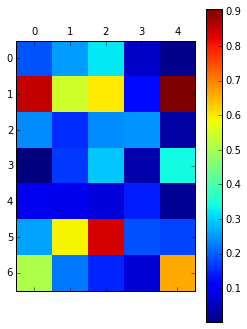

In [24]:
# Look at the uncorrected p-values for the GLM with diagnosis across networks
tmp = plt.matshow(-np.log10(pval_store))
tmp = plt.colorbar()

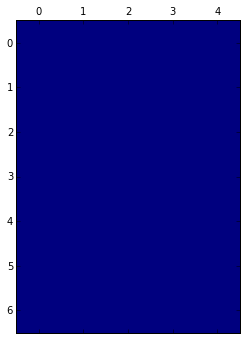

In [25]:
# Now look at the mask of p-values passing FDR Correction
pval_vec = np.reshape(pval_store, np.prod(pval_store.shape))
pcorr_vec = sts.multicomp.fdrcorrection0(pval_vec, 0.05)
pcorr_store = np.reshape(pcorr_vec[0], pval_store.shape)
tmp = plt.matshow(pcorr_store)

In [26]:
# Find the p-values passing FDR (from the above mask)
np.argwhere(pcorr_store)

array([], shape=(0, 2), dtype=int64)

## Overview of subtypes across all networks

In [27]:
# Turn the grand average into an image
gdavg_img = nib.Nifti1Image(gdavg, affine=m_img.get_affine(), header=m_img.get_header())

In [28]:
# Turn the priors into an image
tmp_prior = nib.load(prior_path).get_data()
prior = nib.load(prior_path)
prior_data = prior.get_data()
prior_temp = np.zeros((prior_data.shape + (scale,)))
for sc_id in range(scale):
    tmp = np.zeros_like(prior_data)
    tmp[prior_data==sc_id+1] = sc_id + 1
    prior_temp[..., sc_id] = tmp
prior_img = nib.Nifti1Image(prior_temp, affine=m_img.get_affine(), header=m_img.get_header())

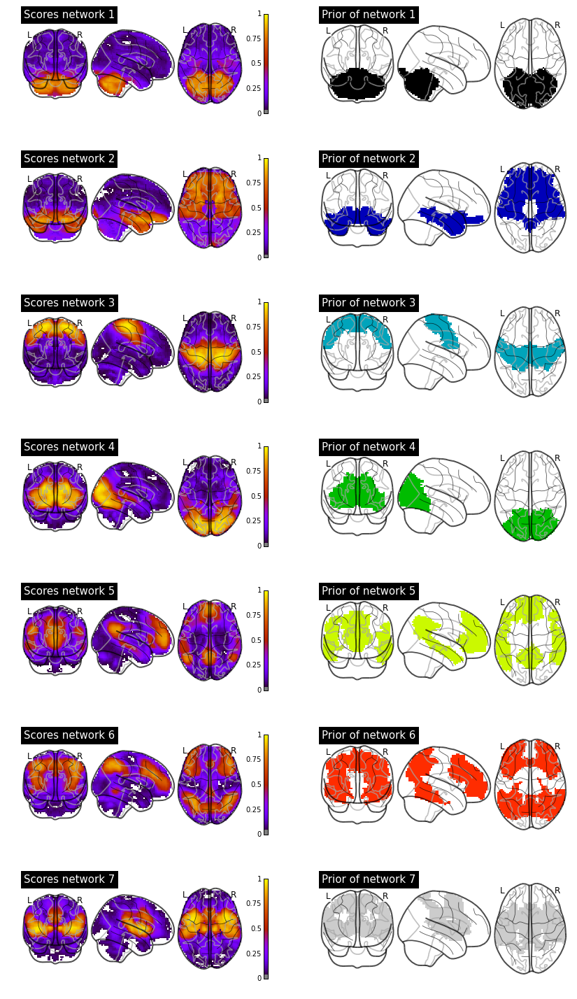

In [31]:
# Plot scores maps for all networks
fig = plt.figure(figsize=(14,25))
gs = gridspec.GridSpec(7, 2, hspace=0.3)
for s_id in np.arange(0,7):
    ax1 = fig.add_subplot(gs[s_id,0])
    nlp.plot_glass_brain(nil.image.index_img(gdavg_img,s_id), cmap=plt.cm.gnuplot, 
                         axes=ax1, colorbar=True, title='Scores network {}'.format(s_id+1),
                        vmin=0, vmax=1)
    ax2 = fig.add_subplot(gs[s_id,1])
    nlp.plot_glass_brain(nil.image.index_img(prior_img,s_id), cmap=plt.cm.spectral, 
                         axes=ax2, colorbar=False, title='Prior of network {}'.format(s_id+1),
                        vmin=1, vmax=7)

## Network 1

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.2254
Date:                Thu, 05 Nov 2015   Prob (F-statistic):              0.879
Time:                        22:43:48   Log-Likelihood:                 83.845
No. Observations:                 278   AIC:                            -161.7
Df Residuals:                     275   BIC:                            -150.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
dominic_dep    -0.0011      0.002     -0.466      

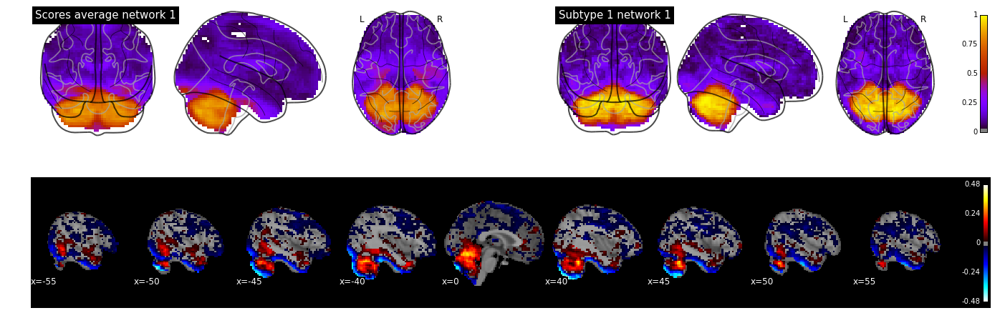

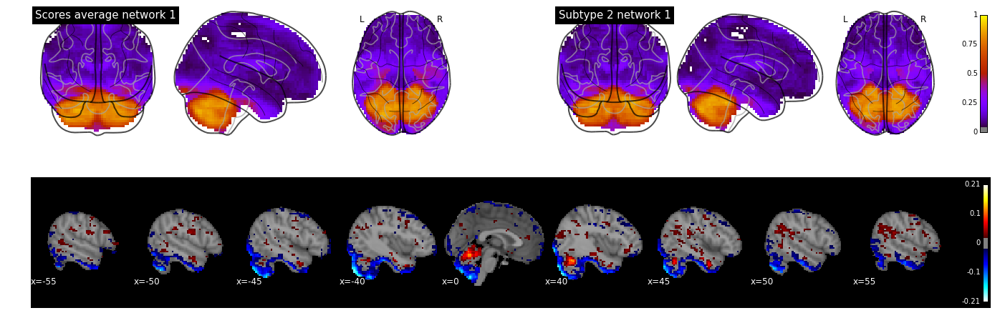

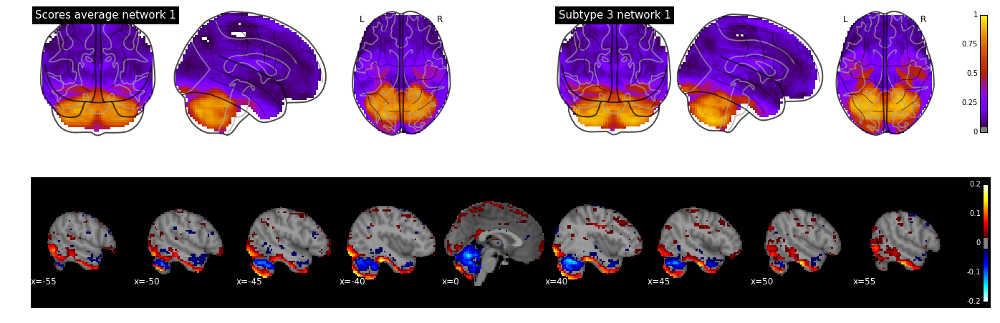

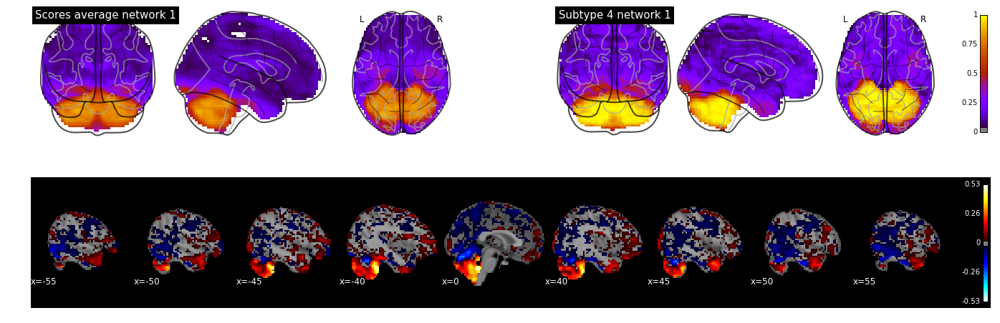

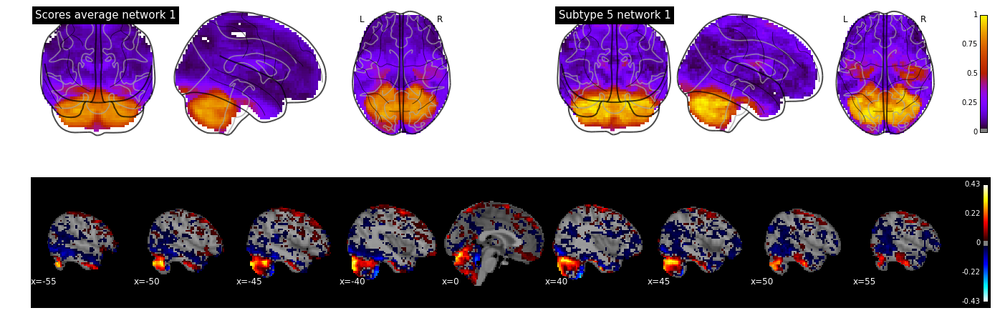

In [35]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 0
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 2

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.007
Date:                Thu, 05 Nov 2015   Prob (F-statistic):              0.390
Time:                        22:49:27   Log-Likelihood:                 62.127
No. Observations:                 278   AIC:                            -118.3
Df Residuals:                     275   BIC:                            -107.4
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
dominic_dep     0.0038      0.003      1.476      

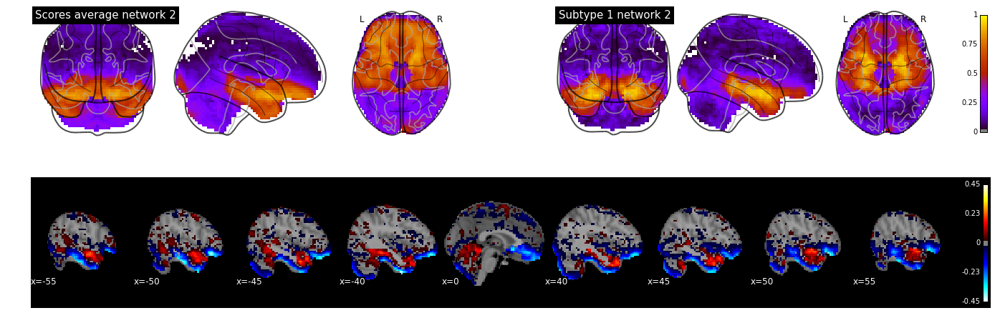

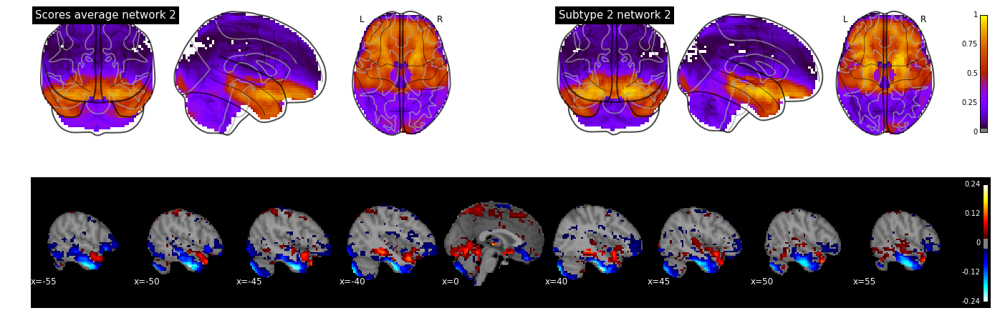

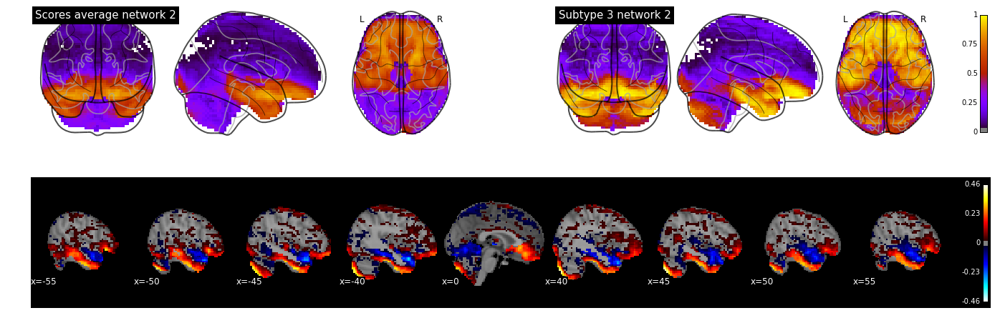

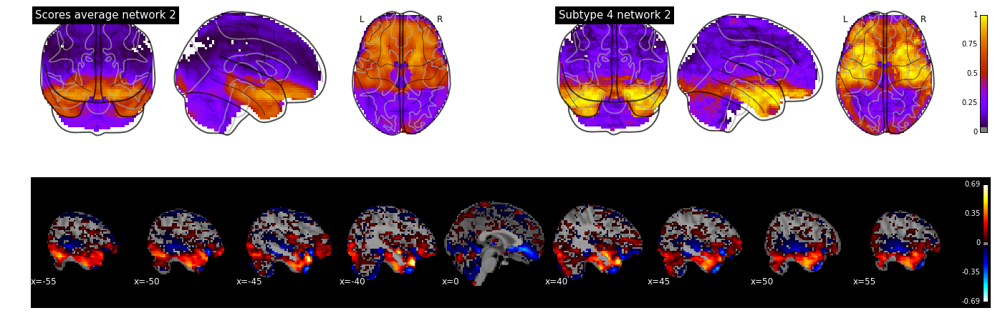

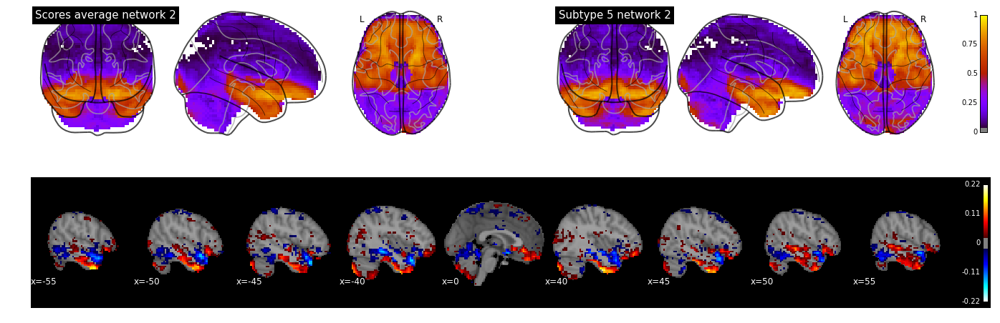

In [36]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 1
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 3

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.041
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     3.958
Date:                Thu, 05 Nov 2015   Prob (F-statistic):            0.00870
Time:                        22:49:46   Log-Likelihood:                 45.559
No. Observations:                 278   AIC:                            -85.12
Df Residuals:                     275   BIC:                            -74.23
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
dominic_dep    -0.0016      0.003     -0.561      

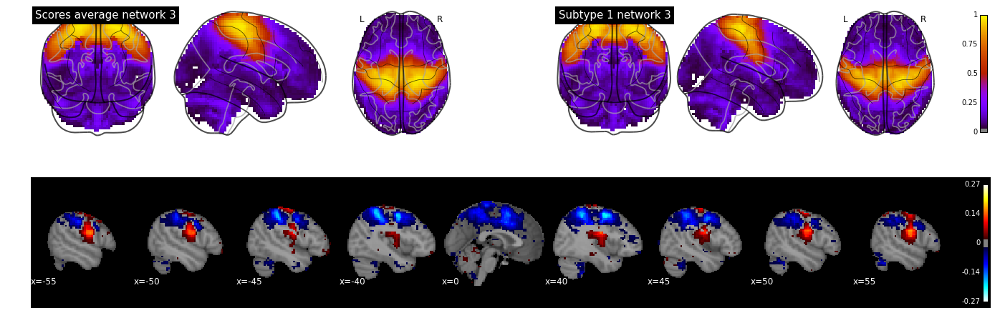

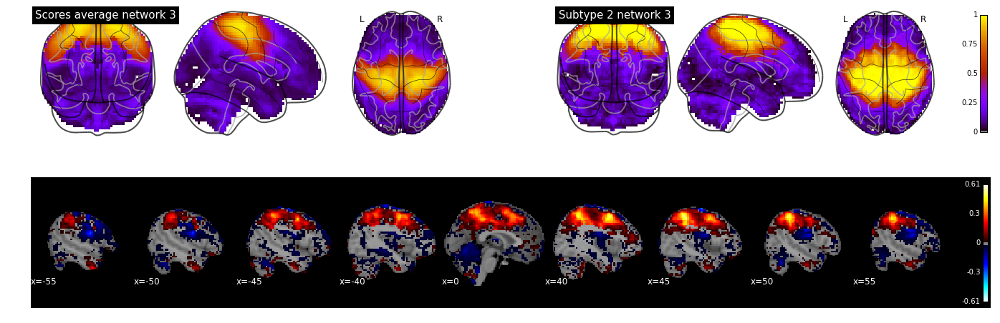

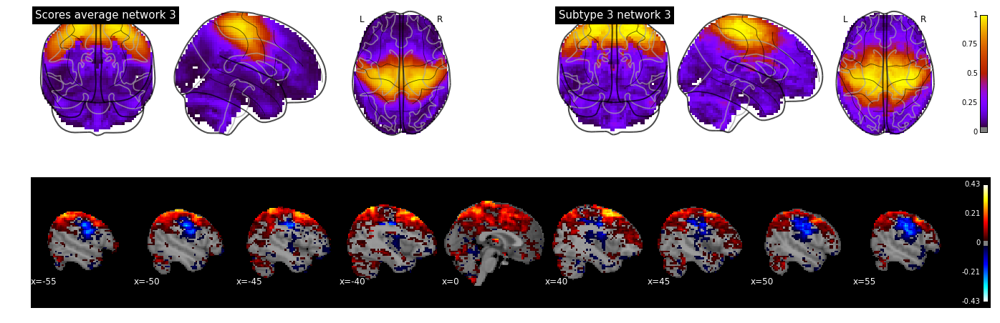

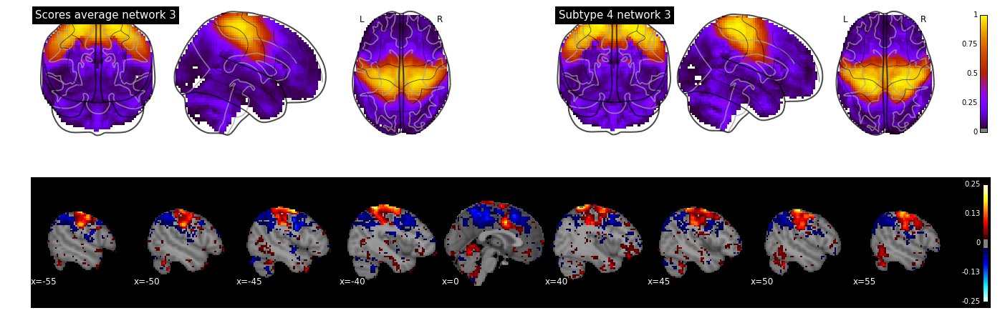

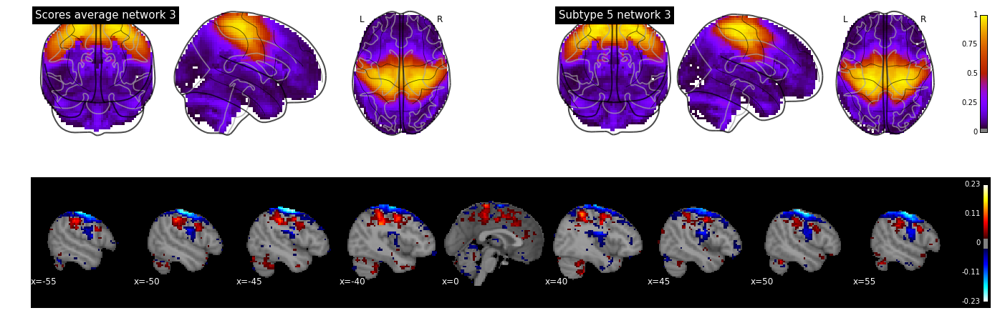

In [37]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 2
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 4

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.2525
Date:                Thu, 05 Nov 2015   Prob (F-statistic):              0.860
Time:                        22:50:05   Log-Likelihood:                 79.297
No. Observations:                 278   AIC:                            -152.6
Df Residuals:                     275   BIC:                            -141.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
dominic_dep  1.915e-05      0.002      0.008      

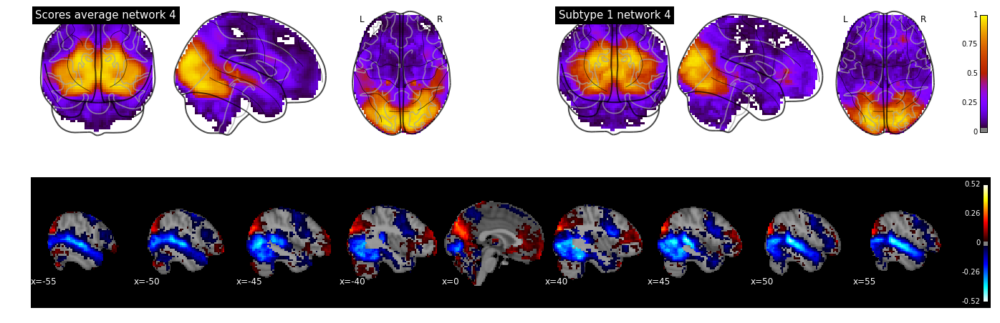

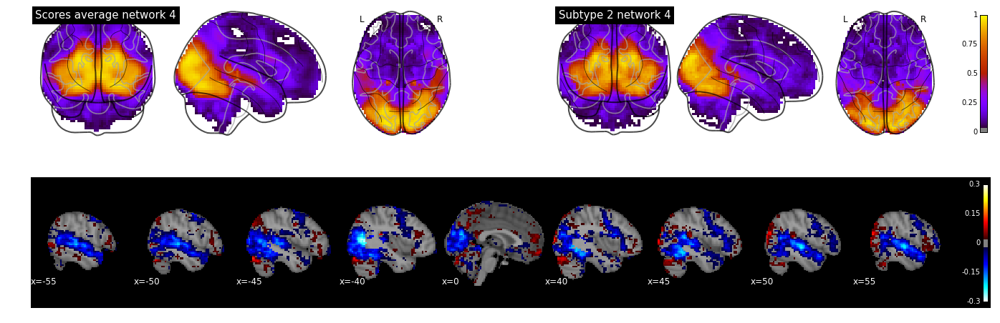

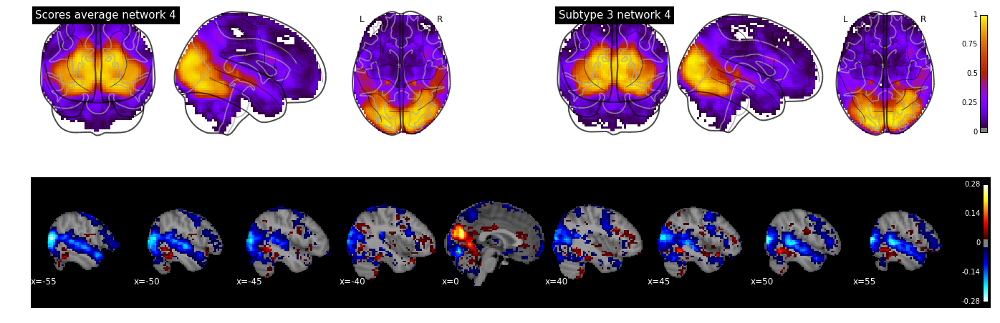

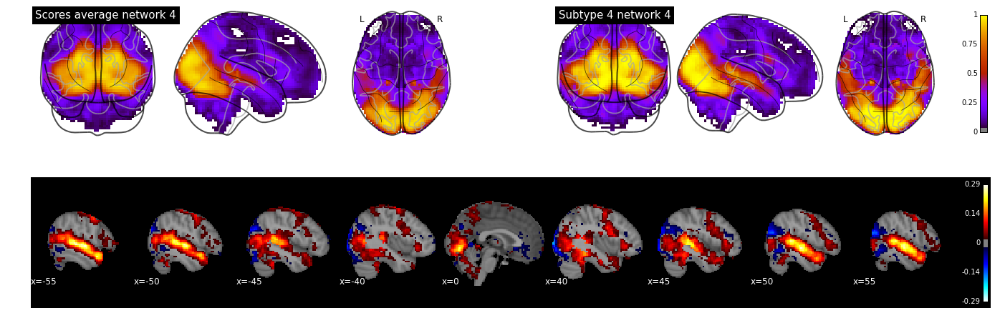

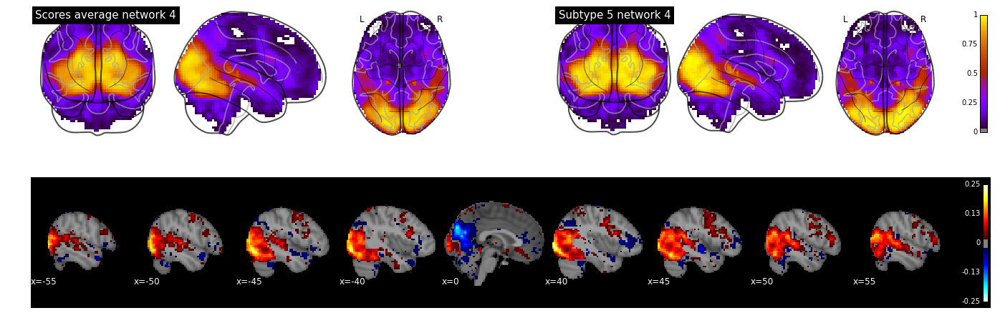

In [38]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 3
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 5

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.046
Date:                Thu, 05 Nov 2015   Prob (F-statistic):              0.373
Time:                        22:50:25   Log-Likelihood:                 81.050
No. Observations:                 278   AIC:                            -156.1
Df Residuals:                     275   BIC:                            -145.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
dominic_dep     0.0006      0.002      0.242      

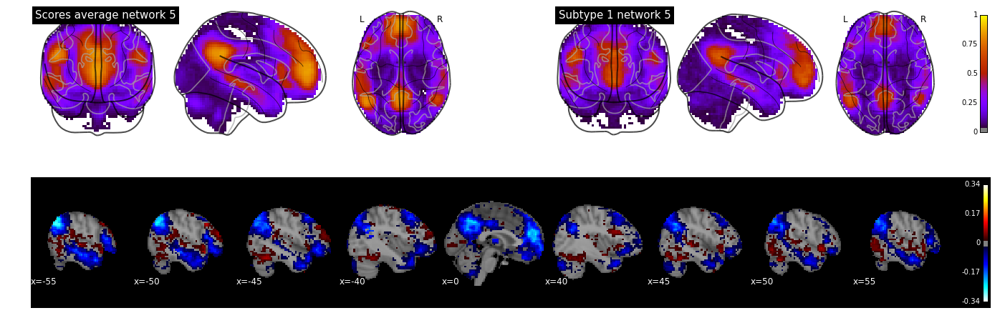

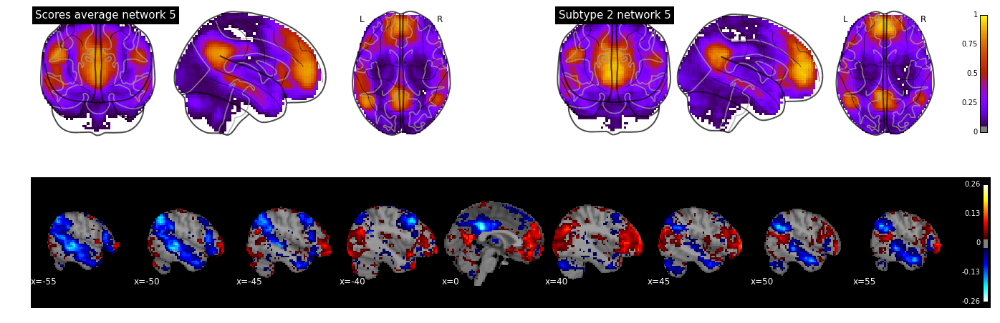

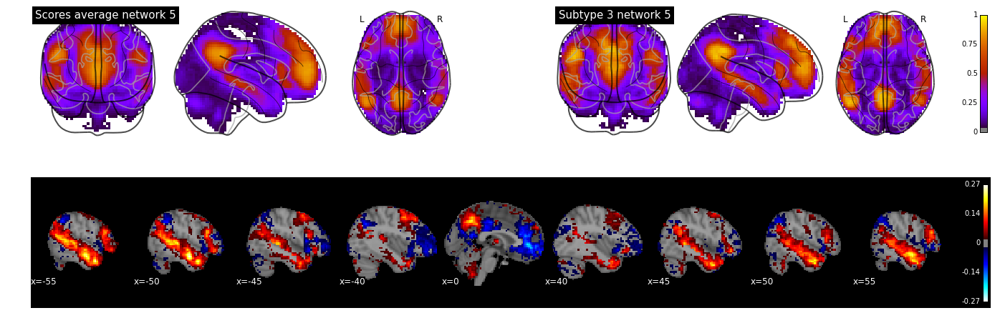

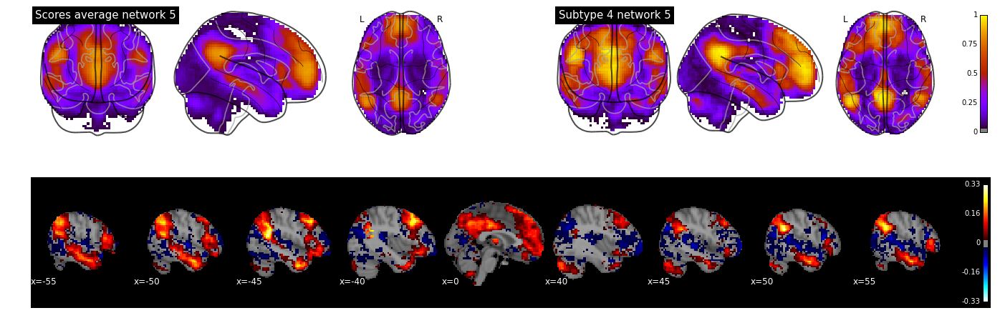

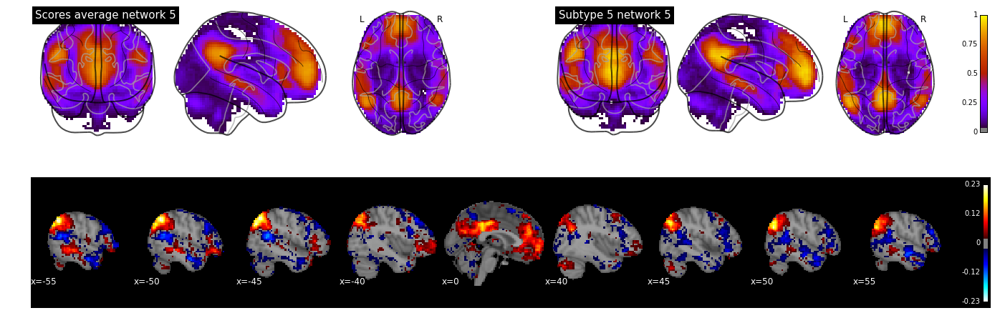

In [39]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 4
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 6

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.8645
Date:                Thu, 05 Nov 2015   Prob (F-statistic):              0.460
Time:                        22:50:43   Log-Likelihood:                 122.28
No. Observations:                 278   AIC:                            -238.6
Df Residuals:                     275   BIC:                            -227.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
dominic_dep     0.0013      0.002      0.602      

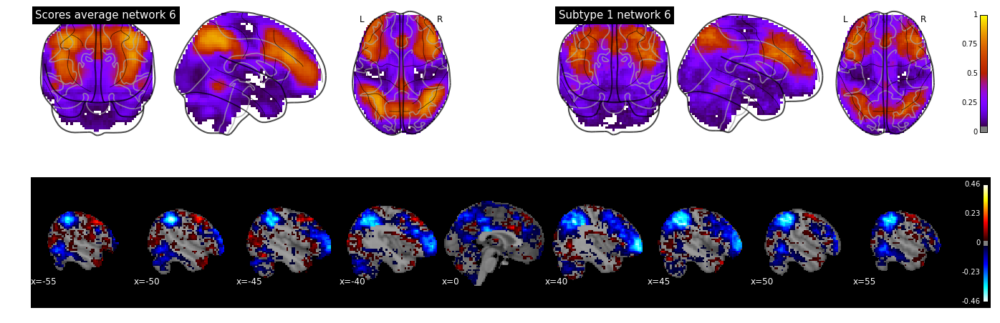

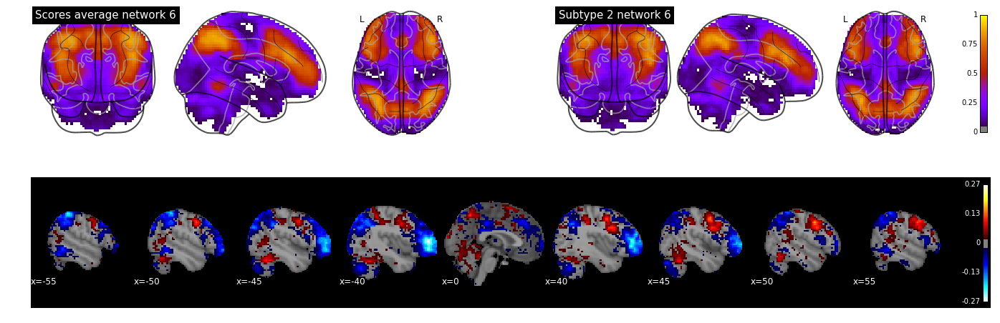

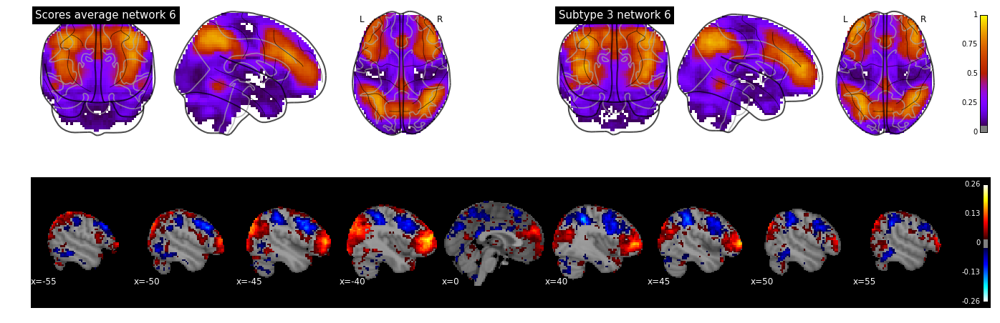

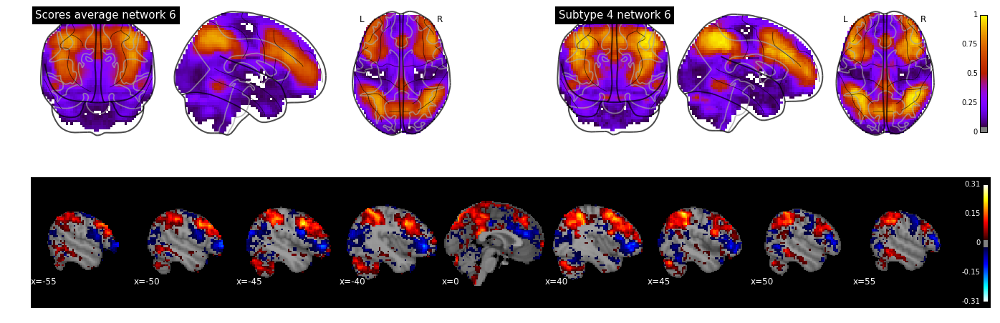

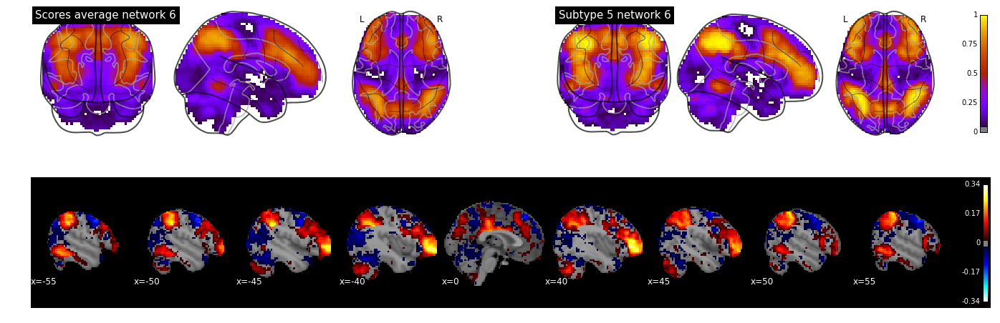

In [40]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 5
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())

## Network 7

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.8567
Date:                Thu, 05 Nov 2015   Prob (F-statistic):              0.464
Time:                        22:51:02   Log-Likelihood:                 167.04
No. Observations:                 278   AIC:                            -328.1
Df Residuals:                     275   BIC:                            -317.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [95.0% Conf. Int.]
-------------------------------------------------------------------------------
dominic_dep    -0.0018      0.002     -1.018      

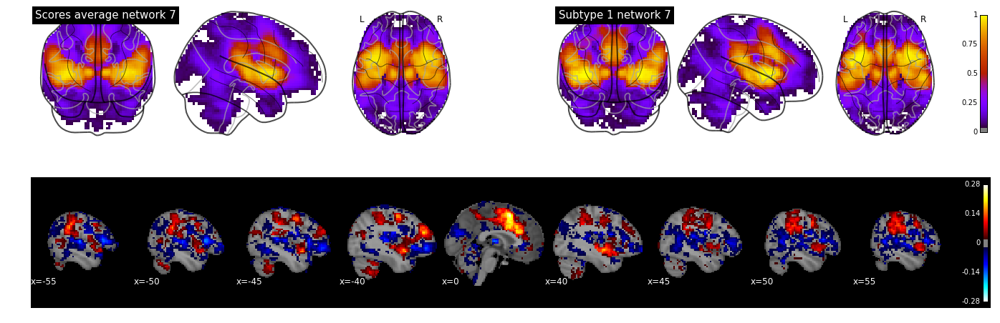

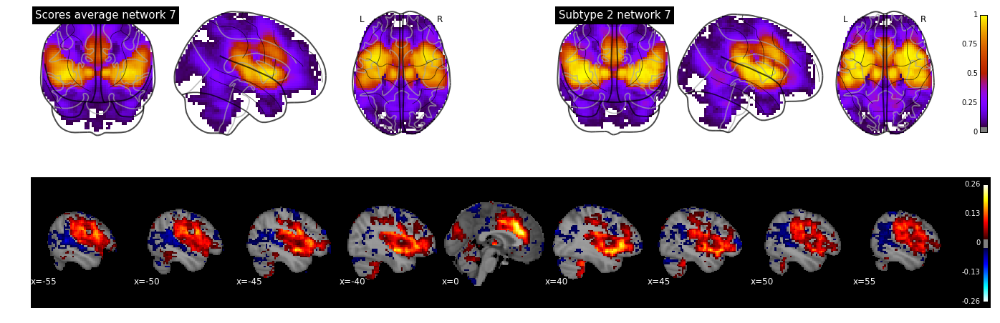

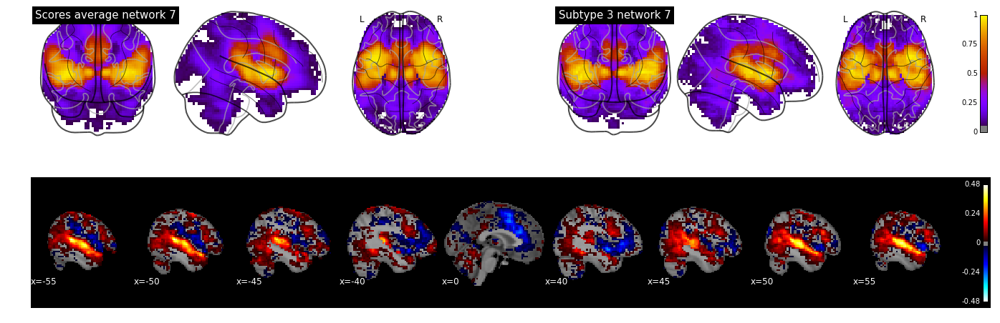

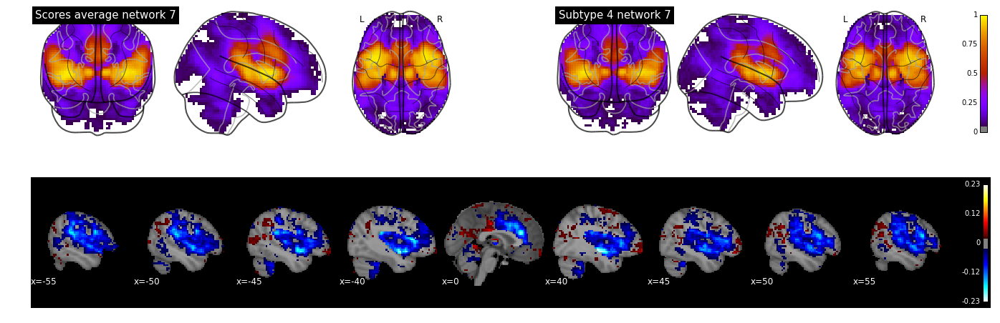

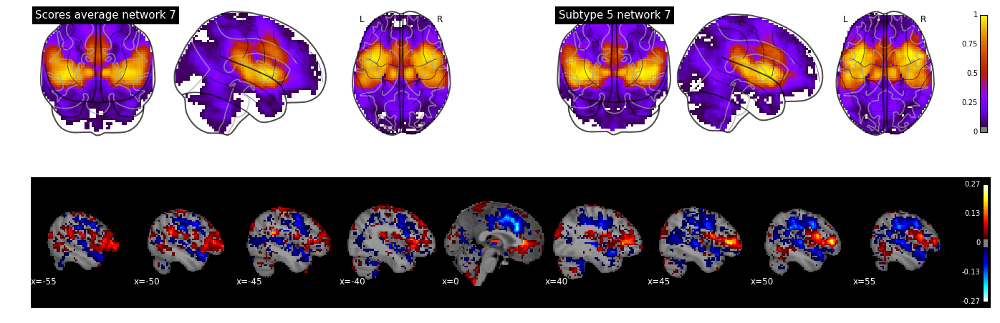

In [41]:
# vr = np.concatenate((np.arange(-55,-35,5), np.arange(40,55,5)))
vr = np.array([-55,-50,-45,-40,0,40,45,50,55])
netw_ind = 6
for subt_ind in np.arange(0,subtypes):
    fig = show_subtype(netw_ind, subt_ind, gdavg_img, sbt_store_2, sbt_store, threshold=0.02, view_range=vr, view_mode='x')
    print(res_store[netw_ind][subt_ind].summary())